# AirBnB Listings in Los Angeles, CA
##### Data source: http://insideairbnb.com/get-the-data.html
##### Date compiled: May 8, 2020
## Explanatory Visualizations

### Dependencies

In [1]:
from datetime import datetime

from scipy import stats
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from utils import utils, plotting

%matplotlib inline

In [2]:
# Settings
pd.options.display.max_columns = 200
pd.options.display.max_rows = 50000
sns.set()
px.set_mapbox_access_token(utils.get_token())

### Data

In [3]:
listings = pd.read_pickle('data/listings_clean.pkl')
listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37028 entries, 0 to 37047
Data columns (total 38 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   id                                37028 non-null  int64         
 1   host_is_superhost                 37028 non-null  float64       
 2   neighbourhood_cleansed            37028 non-null  object        
 3   zipcode                           37028 non-null  object        
 4   latitude                          37028 non-null  float64       
 5   longitude                         37028 non-null  float64       
 6   property_type                     37028 non-null  object        
 7   room_type                         37028 non-null  object        
 8   accommodates                      37028 non-null  int64         
 9   bathrooms                         37028 non-null  float64       
 10  bedrooms                          37028 non-nu

### Rename and recast columns

In [4]:
# Rename columns to simpler names
listings.rename(columns={'host_is_superhost': 'by_superhost',
                         'neighbourhood_cleansed': 'neighborhood',
                         'review_scores_rating': 'score_rtg',
                         'review_scores_accuracy': 'score_accu',
                         'review_scores_cleanliness': 'score_clean',
                         'review_scores_checkin': 'score_check',
                         'review_scores_communication': 'score_comm',
                         'review_scores_location': 'score_loc',
                         'review_scores_value': 'score_val'}, inplace=True)

# Cast `by_superhost` as integer type
listings['by_superhost'] = listings.by_superhost.astype(int)
listings.head(2)

,id,by_superhost,neighborhood,zipcode,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,first_review,last_review,score_rtg,score_accu,score_clean,score_check,score_comm,score_loc,score_val,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,reviews_per_month
0,109,0,Culver City,90230,33.98209,-118.38494,Condominium,Entire home/apt,6,2.0,2.0,3.0,122.0,500.0,240.0,3,25.0,30,0,0,0,38,2,0,2011-08-15,2016-05-15,80.0,10.0,10.0,6.0,8.0,10.0,8.0,0,strict_14_with_grace_period,1,0,0.02
1,344,0,Burbank,91505,34.16562,-118.33458,House,Entire home/apt,6,1.0,3.0,3.0,168.0,0.0,100.0,6,0.0,15,0,1,6,97,8,2,2016-06-14,2019-10-19,97.0,10.0,10.0,10.0,10.0,10.0,10.0,1,flexible,0,0,0.17


### Filter out listings with an outlier price

In [5]:
list765 = listings[listings.price <= 765].copy()
list765.describe()

,id,by_superhost,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,score_rtg,score_accu,score_clean,score_check,score_comm,score_loc,score_val,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,reviews_per_month
count,3.556300e+04,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,35563.000000,28295.000000,28248.000000,28249.000000,28238.000000,28247.000000,28234.000000,28230.000000,35563.000000,35563.000000,35563.000000,35563.000000
mean,2.505182e+07,0.328797,34.050258,-118.313326,3.442032,1.371439,1.344740,1.862947,140.761016,269.070410,76.392655,1.848466,14.443916,15.482833,14.973849,32.450384,50.488120,165.779406,36.362371,12.142733,94.269553,9.612928,9.416652,9.748212,9.717386,9.705001,9.432944,0.436015,0.013582,0.021258,1.312094
std,1.280203e+07,0.469783,0.121526,0.163990,2.410231,0.772871,0.972507,1.518274,115.610321,594.610912,79.641091,1.594151,24.709441,11.178341,13.336440,25.868994,38.232703,142.389288,65.212058,18.640812,9.013689,0.887676,1.008461,0.774724,0.827613,0.730063,0.935986,0.495896,0.115747,0.144245,1.707011
min,1.090000e+02,0.000000,33.338830,-118.934220,1.000000,0.000000,0.000000,0.000000,10.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,1.498344e+07,0.000000,33.997370,-118.419410,2.000000,1.000000,1.000000,1.000000,68.000000,0.000000,20.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,93.000000,9.000000,9.000000,10.000000,10.000000,10.000000,9.000000,0.000000,0.000000,0.000000,0.080000
50%,2.612833e+07,0.000000,34.060980,-118.340130,2.000000,1.000000,1.000000,1.000000,100.000000,100.000000,55.000000,1.000000,5.000000,15.000000,17.000000,38.000000,66.000000,147.000000,9.000000,3.000000,97.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.000000,0.000000,0.000000,0.580000
75%,3.672257e+07,1.000000,34.104125,-118.248790,4.000000,1.500000,2.000000,2.000000,172.000000,300.000000,100.000000,2.000000,20.000000,30.000000,29.000000,59.000000,89.000000,333.000000,42.000000,17.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,0.000000,0.000000,1.980000
max,4.338380e+07,1.000000,34.811190,-117.652640,24.000000,11.500000,11.000000,50.000000,754.000000,5100.000000,749.000000,24.000000,300.000000,30.000000,30.000000,60.000000,90.000000,365.000000,822.000000,211.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,1.000000,1.000000,17.230000


### Is there a difference with listings by superhosts?

In [6]:
# Create a categorical column for `by_superhost`
list765['Listings by:'] = list765.by_superhost.map(lambda s: 'Superhost' if s else 'Regular host')
list765.head(2)

,id,by_superhost,neighborhood,zipcode,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,first_review,last_review,score_rtg,score_accu,score_clean,score_check,score_comm,score_loc,score_val,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,reviews_per_month,Listings by:
0,109,0,Culver City,90230,33.98209,-118.38494,Condominium,Entire home/apt,6,2.0,2.0,3.0,122.0,500.0,240.0,3,25.0,30,0,0,0,38,2,0,2011-08-15,2016-05-15,80.0,10.0,10.0,6.0,8.0,10.0,8.0,0,strict_14_with_grace_period,1,0,0.02,Regular host
1,344,0,Burbank,91505,34.16562,-118.33458,House,Entire home/apt,6,1.0,3.0,3.0,168.0,0.0,100.0,6,0.0,15,0,1,6,97,8,2,2016-06-14,2019-10-19,97.0,10.0,10.0,10.0,10.0,10.0,10.0,1,flexible,0,0,0.17,Regular host


,regular_hosts,superhosts
count,23870.000000,11693.000000
mean,139.162673,144.023860
std,117.277288,112.064673
min,10.000000,10.000000
25%,65.000000,75.000000
50%,100.000000,110.000000
75%,170.000000,175.000000
max,752.000000,754.000000


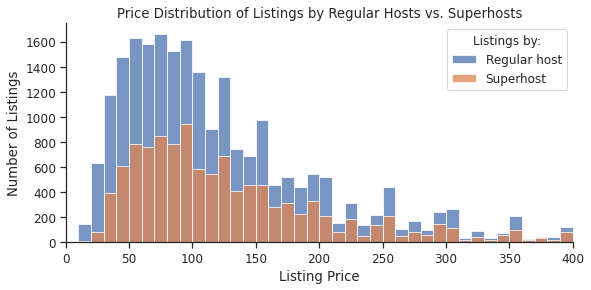

In [7]:
# Price distribution for listings by regular hosts and superhosts
sns.set(style='ticks', font_scale=1.1)
grid1 = sns.FacetGrid(list765, hue='Listings by:', height=4, aspect=2, legend_out=False)
grid1.map(plt.hist, 'price', bins=range(0, 770, 10), alpha=0.75)
grid1.set(xlim=(0, 400), xlabel='Listing Price', ylabel='Number of Listings', title='Price Distribution of Listings by Regular Hosts vs. Superhosts')
grid1.add_legend()

# Descriptive statistics of price
utils.desc_byhost(df=list765, col='price')

,regular_hosts,superhosts
count,17439.000000,10856.000000
mean,92.211767,97.575166
std,10.673836,3.319286
min,20.000000,20.000000
25%,90.000000,97.000000
50%,95.000000,98.000000
75%,100.000000,100.000000
max,100.000000,100.000000


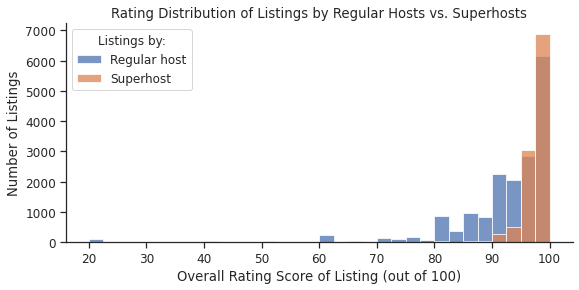

In [8]:
# Rating distribution of listings by regular hosts and superhosts
sns.set(style='ticks', font_scale=1.1)
grid2 = sns.FacetGrid(list765, hue='Listings by:', height=4, aspect=2, legend_out=False)
grid2.map(plt.hist, 'score_rtg', bins=32, alpha=0.75)
grid2.set(xlabel='Overall Rating Score of Listing (out of 100)', ylabel='Number of Listings', title='Rating Distribution of Listings by Regular Hosts vs. Superhosts')
grid2.add_legend()

# Descriptive statistics of rating
utils.desc_byhost(df=list765, col='score_rtg')

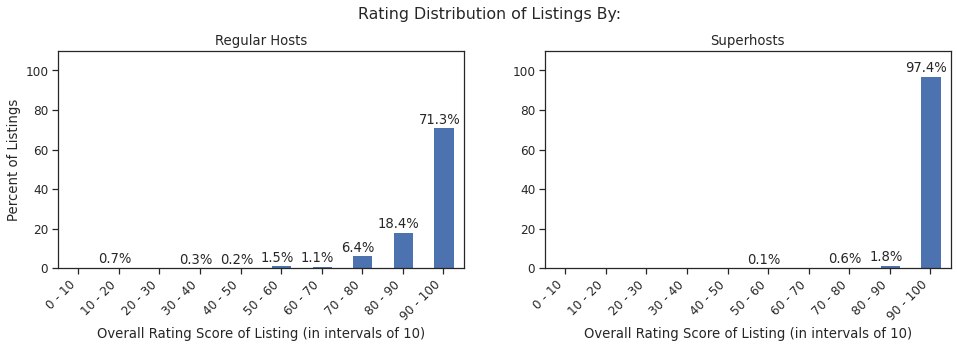

In [9]:
sns.set(style='ticks', font_scale=1.1)
fig1, ax1 = plt.subplots(1, 2, figsize=(16, 4))


# Rating distribution in relative terms
plotting.hist_pct(df=list765, ax=ax1[0], filter_val=0, title='Regular Hosts', xlab='Overall Rating Score of Listing (in intervals of 10)', ylab='Percent of Listings')
plotting.hist_pct(df=list765, ax=ax1[1], filter_val=1, title='Superhosts', xlab='Overall Rating Score of Listing (in intervals of 10)')
fig1.suptitle('Rating Distribution of Listings By:', va='bottom');

In [10]:
# Save figures
grid1.savefig('figs/q1-1-4x8.png', bbox_inches='tight')
grid2.savefig('figs/q1-2-4x8.png', bbox_inches='tight')
fig1.savefig('figs/q1-3.png', bbox_inches='tight')

### Where are the best-rated listings?

In [74]:
# Extract listings with at least 50 reviews and an overall rating of 100
rating100 = list765[(list765.number_of_reviews >= 50) & (list765.score_rtg == 100)].copy()

# Count the number of listings by neighborhood and select neighborhoods where the count is at least 10
top_nb = utils.agg_to_2cols(df=rating100, agg_col='score_rtg', agg_col_name='Number of Listings with an Average Overall Rating of 100/100', agg_by_mean=False)
top_nb = top_nb[top_nb['Number of Listings with an Average Overall Rating of 100/100'] >= 10]

# Calculate the average listing price of these listings by neighborhood
avg_price = utils.agg_to_2cols(df=rating100, agg_col='price', agg_col_name='Average Listing Price')
avg_price = avg_price[avg_price.Neighborhood.isin(top_nb.Neighborhood.tolist())]

# # Calculate the average availability of these listings by neighborhood
# avg_avail = utils.agg_to_2cols(df=rating100, agg_col='availability_365', agg_col_name='Number of Days the Listing was Available in the Last 365 Days')
# avg_avail = avg_avail[avg_avail.Neighborhood.isin(top_nb.Neighborhood.tolist())]

top_nb = pd.merge(top_nb, avg_price, on='Neighborhood', how='left').sort_values('Number of Listings with an Average Overall Rating of 100/100', ascending=False)
top_nb

,Neighborhood,Number of Listings with an Average Overall Rating of 100/100,Average Listing Price
0,Venice,29,232.45
1,Silver Lake,23,151.13
2,Long Beach,21,117.33
3,Santa Monica,17,160.82
4,Hollywood Hills West,15,263.20
5,Echo Park,13,159.62
6,Sherman Oaks,13,166.69
7,Topanga,12,183.25
8,Hollywood,11,121.36
9,Highland Park,11,100.27


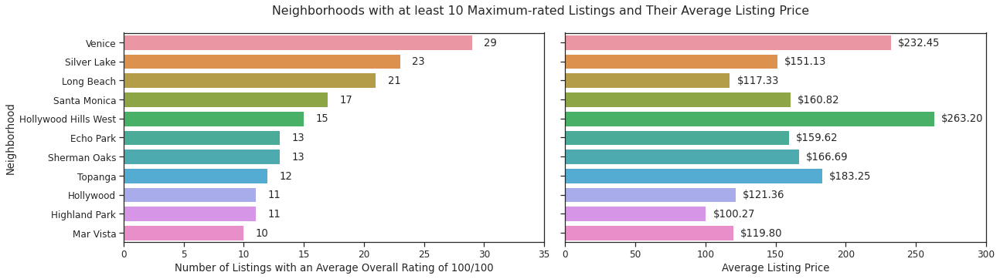

In [77]:
sns.set(style='ticks', font_scale=1.1)
fig2, ax2 = plt.subplots(1, 2, figsize=(20, 5))
plt.subplots_adjust(wspace=0.05)
fig2.suptitle('Neighborhoods with at least 10 Maximum-rated Listings and Their Average Listing Price')

# Number of Listings with an Average Overall Rating of 100/100
sns.barplot(data=top_nb, x='Number of Listings with an Average Overall Rating of 100/100', y='Neighborhood', ax=ax2[0])
ax2[0].set_xlim(0, 35)
for i in range(11):
    n = top_nb.iloc[i, 1]
    ax2[0].text(n + 1, i, f'{n}', va='center')

# Average listing price
sns.barplot(data=top_nb, x='Average Listing Price', y='Neighborhood', ax=ax2[1])
ax2[1].set_ylabel('')
ax2[1].set_yticklabels([])
ax2[1].set_xlim(0, 300)
for i in range(11):
    n = top_nb.iloc[i, 2]
    ax2[1].text(n + 5 , i, f'${n:.02f}', va='center')

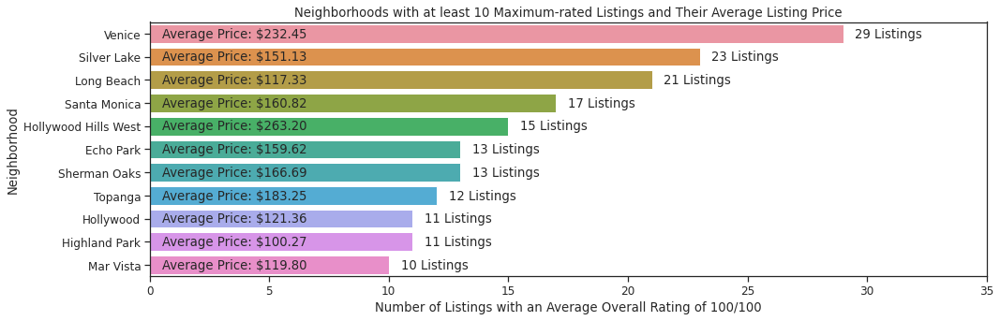

In [100]:
sns.set(style='ticks', font_scale=1.1)
fig2_2 = plt.figure(figsize=(16, 5))
plt.title('Neighborhoods with at least 10 Maximum-rated Listings and Their Average Listing Price')

# Number of Listings with an Average Overall Rating of 100/100
sns.barplot(data=top_nb, x='Number of Listings with an Average Overall Rating of 100/100', y='Neighborhood')
plt.xlim(0, 35)
for i in range(11):
    n = top_nb.iloc[i, 1]
    plt.text(n + 0.5, i, f'{n} Listings', va='center')
    
# Show average price of each neighborhood
for i in range(11):
    price = top_nb.iloc[i, 2]
    plt.text(0.5, i, f'Average Price: ${price:.02f}', va='center')

In [101]:
# Save figures
fig2.savefig('figs/q2-1-sub.png', bbox_inches='tight')
fig2_2.savefig('figs/q2-1-fig.png', bbox_inches='tight')

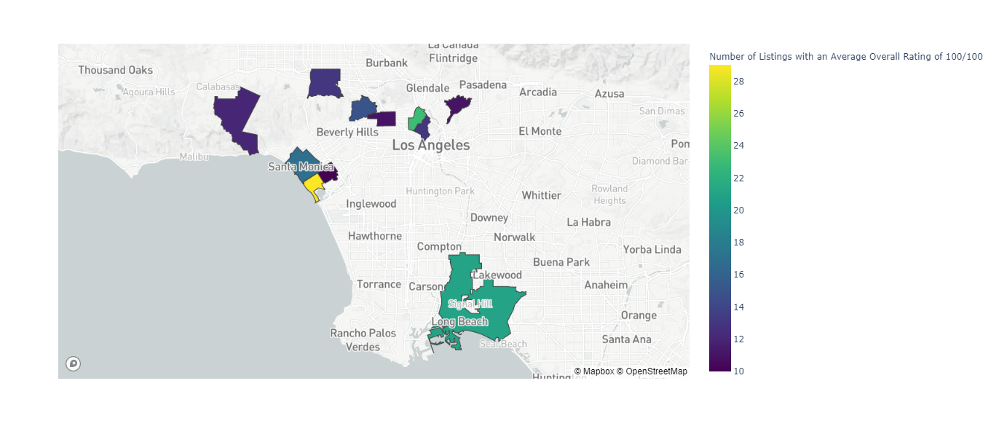

In [106]:
# Neighborhoods with at least 10 listings that have at least 50 reviews and an overall rating of 100
fig2map = px.choropleth_mapbox(top_nb, geojson=plotting.get_langeo(), featureidkey='properties.name', 
                               color='Number of Listings with an Average Overall Rating of 100/100', 
                               locations='Neighborhood', center={'lat': 33.95, 'lon': -118.35}, 
                               zoom=9, height=600, color_continuous_scale='Viridis', range_color=None)
fig2map.show()

### Where can we find low-cost versus high-end listings?

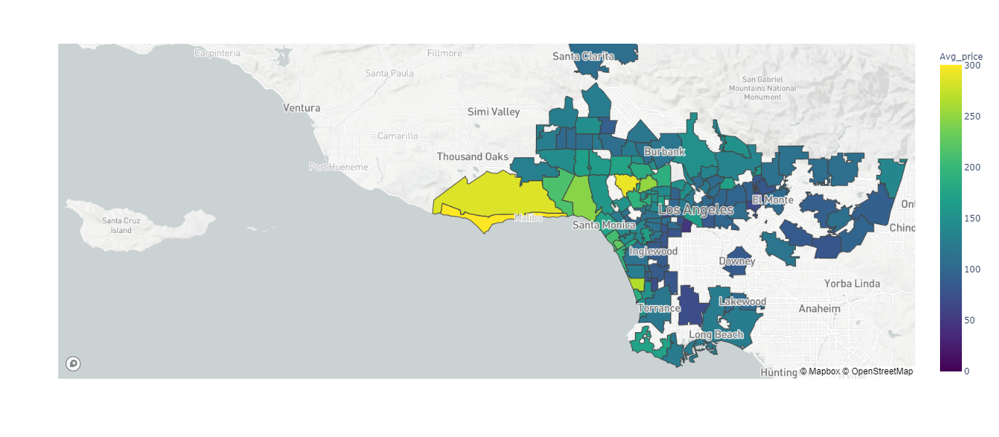

In [115]:
# Neighborhoods with at least 50 listings
nb50 = utils.agg_to_2cols(df=list765, agg_col='price', agg_col_name='Price', agg_by_mean=False)
nb50 = nb50[nb50.Price >= 50]

# Average listing price by neighborhood
prices = list765[list765.neighborhood.isin(nb50.Neighborhood)]
prices = utils.agg_to_2cols(df=prices, agg_col='price', agg_col_name='Avg_price')

# Average listing price of neighborhoods with at least 50 listings
fig = plotting.choropleth_map(df=prices, color_col='Avg_price', center_lat=34.05, center_lon=-118.80, 
                              zoom=8.5, height=600, colorbar_range=(0, 300))
fig.show()

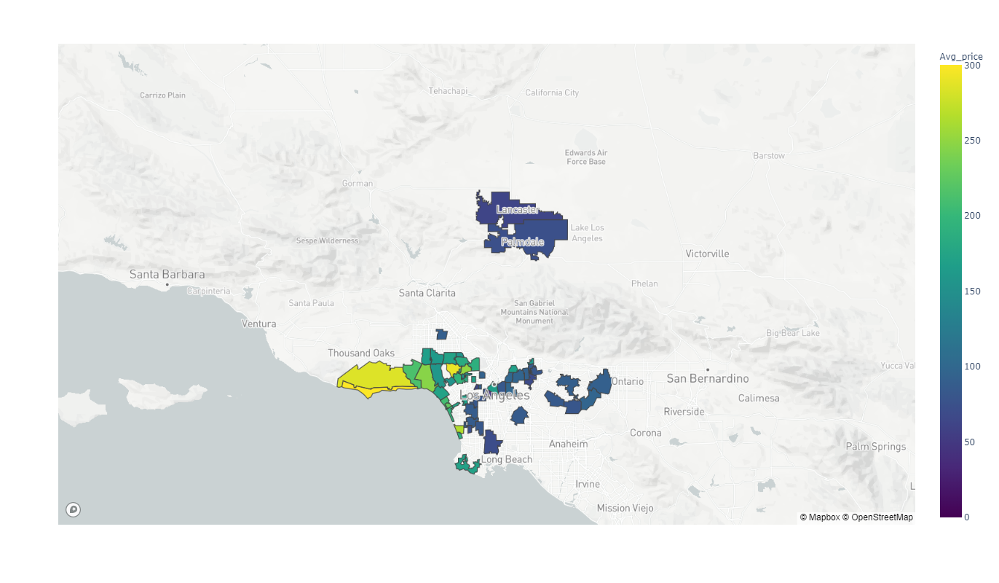

In [26]:
# 30 most expensive and 30 cheapest neighborhoods
fig = plotting.choropleth_map(df=pd.concat([prices.iloc[:30], prices.iloc[-30:]]), color_col='Avg_price', center_lat=34.20, center_lon=-118.25, 
                              zoom=8.5, height=800, colorbar_range=(0, 300))
fig.show()